#  Обнаружение объектов

__Автор задач: Блохин Н.В. (NVBlokhin@fa.ru)__

Материалы:
* https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html
* https://pyimagesearch.com/2021/11/01/training-an-object-detector-from-scratch-in-pytorch/
* https://pyimagesearch.com/2021/08/02/pytorch-object-detection-with-pre-trained-networks/

## Задачи для совместного разбора

1. Рассмотрите простейшую архитектуру для решения задачи object detection и процесс настройки модели.

## Задачи для самостоятельного решения

<p class="task" id="1"></p>

1\. Напишите функцию `parse_xml`, которая читает xml-файл с разметкой изображения из архива `animals.zip` и возвращает словарь, содержащий три ключа:
```
{
        "raw": # словарь с ключами xmin, ymin, xmax, ymax
        "scaled": # словарь с ключами xmin, ymin, xmax, ymax
        "obj_name": # строка
}
```
В этом словаре `row` - абсолютные значения координат вершин bounding box, а `scaled` - относительные (нормированные на ширину и высоту изображения). Примените функцию к файлу `cat.0.xml` и выведите результат на экран.


- [ ] Проверено на семинаре

In [ ]:
import xml.etree.ElementTree as ET

def parse_xml(xml_file):

  tree = ET.parse(xml_file)
  root = tree.getroot()
  size = root.find("size")
  width = int(size.find("width").text)
  height = int(size.find("height").text)
  obj = root.find("object")
  obj_name = obj.find("name").text
  bndbox = obj.find("bndbox")

  raw_coords = {
      "xmin": float(bndbox.find("xmin").text),
      "ymin": float(bndbox.find("ymin").text),
      "xmax": float(bndbox.find("xmax").text),
      "ymax": float(bndbox.find("ymax").text)
  }
  scaled_coords = {
      "xmin": raw_coords["xmin"] / width,
      "ymin": raw_coords["ymin"] / height,
      "xmax": raw_coords["xmax"] / width,
      "ymax": raw_coords["ymax"] / height
  }

  return {
      "raw": raw_coords,
      "scaled": scaled_coords,
      "obj_name": obj_name
  }

In [ ]:
import zipfile
import os

zip_file_path = "animals.zip"
extract_dir = "animals_extracted"

with zipfile.ZipFile(zip_file_path, "r") as zip_ref:
  zip_ref.extractall(extract_dir)

xml_file_path = os.path.join(extract_dir, "Asirra: cat vs dogs", "cat.0.xml")

In [ ]:
print(xml_file_path)

animals_extracted/Asirra: cat vs dogs/cat.0.xml


In [ ]:
result = parse_xml(xml_file_path)
result

{'raw': {'xmin': 126.0, 'ymin': 83.0, 'xmax': 354.0, 'ymax': 243.0},
 'scaled': {'xmin': 0.252,
  'ymin': 0.22192513368983957,
  'xmax': 0.708,
  'ymax': 0.6497326203208557},
 'obj_name': 'cat'}

<p class="task" id="2"></p>

2\. Опишите датасет `AnimalDetectionDataset` на основе архива `animals.zip`. Реализуйте `__getitem__` таким образом, чтобы он возвращал три элемента: тензор с изображением, словарь с координатами bounding box и метку объекта. Предусмотрите возможность передавать извне при создании датасета набор преобразований для изображений, преобразование для метки объекта (для кодирования) и флаг, показывающий, нужно ли возвращать исходные или нормированные координаты bounding box.

- [ ] Проверено на семинаре

In [ ]:
from torch.utils.data import Dataset
from PIL import Image
from torchvision import tv_tensors
from torchvision.transforms.v2 import functional as F

class AnimalDetectionDataset(Dataset):
    def __init__(self, root, transforms=None, target_transform = None, return_scaled=True):
        self.root = root
        self.transforms = transforms
        self.target_transform = target_transform
        self.return_scaled = return_scaled
        data_dir = os.path.join(root, "Asirra: cat vs dogs")
        self.imgs = sorted([f for f in os.listdir(data_dir) if f.endswith(".jpg")])
        self.xmls = sorted([f for f in os.listdir(data_dir) if f.endswith(".xml")])
        assert len(self.imgs) == len(self.xmls), "Number of images and masks dont match"

    def __getitem__(self, index):
        img_name = self.imgs[index]
        xml_name = self.xmls[index]
        img_path = os.path.join(self.root, "Asirra: cat vs dogs", img_name)
        xml_path = os.path.join(self.root, "Asirra: cat vs dogs", xml_name)
        image = Image.open(img_path).convert("RGB")
        parsed_data = parse_xml(xml_path)
        bbox_coords = parsed_data["scaled"] if self.return_scaled else parsed_data["raw"]
        obj_name = parsed_data["obj_name"]

        if self.target_transform:
          obj_name = self.target_transform(obj_name)

        image = tv_tensors.Image(image)
        canvas_size = list(image.shape[-2:])
        target = {}
        target["boxes"] = tv_tensors.BoundingBoxes([list(bbox_coords.values())], format="XYXY", canvas_size=canvas_size)
        target["labels"] = obj_name
        if self.transforms:
          image, target = self.transforms(image, target)
        return image, target


    def __len__(self):
      return len(self.imgs)



<p class="task" id="3"></p>

3\. Создайте объект класса `AnimalDetectionDataset` без применения преобразований и со значением `return_scaled=False`. Напишите функцию `show_image_with_bounding_box` для визуализации изображения с добавлением на него bounding box и подписи объекта. Продемонстрируйте работу функцию на изображении собаки и кошки.

- [ ] Проверено на семинаре

In [ ]:
dataset = AnimalDetectionDataset(
    root="animals_extracted",
    transforms=None,
    target_transform=None,
    return_scaled=False
)

In [ ]:
import matplotlib.pyplot as plt


def show_image_with_bounding_box(image, bbox_coords, label):

  image = image.permute(1, 2, 0)
  print(image.shape)
  plt.figure(figsize=(8, 6))
  plt.imshow(image)
  xmin, ymin, xmax, ymax = bbox_coords
  rect = plt.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, fill=False, edgecolor="red", linewidth=2)
  plt.gca().add_patch(rect)
  plt.text(xmin, ymin-10, label, color="yellow", fontsize=12, bbox=dict(facecolor="red", alpha=0.5))
  plt.axis("off")
  plt.show()


Индекс файла 'dog.0.xml': 550
Индекс файла 'cat.0.xml': 0
torch.Size([375, 499, 3])


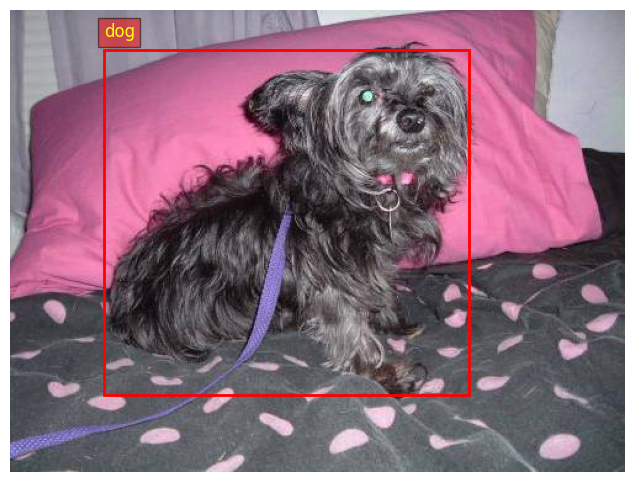

torch.Size([374, 500, 3])


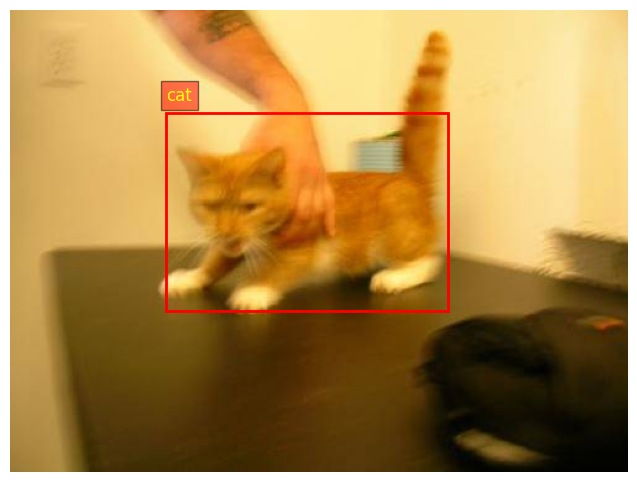

In [ ]:
data_dir = os.path.join("animals_extracted", "Asirra: cat vs dogs")
xml_files = sorted([f for f in os.listdir(data_dir) if f.endswith(".xml")])
try:
    dog_index = xml_files.index("dog.0.xml")
    cat_index = xml_files.index("cat.0.xml")
    print(f"Индекс файла 'dog.0.xml': {dog_index}")
    print(f"Индекс файла 'cat.0.xml': {cat_index}")
except ValueError:
    print("Файл 'dog.0.xml' не найден.")

image_dog, target_dog = dataset[dog_index]
image_cat, target_cat = dataset[cat_index]

bbox_dog = target_dog["boxes"].data[0].tolist()
label_dog = target_dog["labels"]
bbox_cat = target_cat["boxes"].data[0].tolist()
label_cat = target_cat["labels"]


show_image_with_bounding_box(image_dog, bbox_dog, label_dog)
show_image_with_bounding_box(image_cat, bbox_cat, label_cat)

<p class="task" id="4"></p>

4\. Напишите модель для решения задачи выделения объектов. Реализуйте двухголовую сеть, одна голова которой предсказывает метку объекта (задача классификации), а вторая голова предсказывает 4 координаты вершин bounding box (задача регрессии). В качестве backbone используйте модель resnet50 из пакета `torchvision`.

- [ ] Проверено на семинаре

In [ ]:
from torchvision.models import resnet50, ResNet50_Weights
from PIL import Image
import torch
import torch.nn as nn

In [ ]:
class TwoHeadModel(nn.Module):
  def __init__(self, num_classes):
    super(TwoHeadModel, self).__init__()
    self.num_classes = num_classes
    self.backbone = resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
    for param in self.backbone.parameters():
      param.requires_grad = False

    self.backbone.fc = nn.Identity()
    self.regressor = nn.Sequential(
        nn.Linear(2048, 128),
        nn.ReLU(),
        nn.Linear(128, 64),
        nn.ReLU(),
        nn.Linear(64, 32),
        nn.ReLU(),
        nn.Linear(32, 4),
        nn.Sigmoid()
    )
    self.classifier = nn.Sequential(
			nn.Linear(2048, 512),
			nn.ReLU(),
			nn.Dropout(),
			nn.Linear(512, 512),
			nn.ReLU(),
			nn.Dropout(),
			nn.Linear(512, self.num_classes)
    )

  def forward(self, x):
    features = self.backbone(x)
    bboxes = self.regressor(features)
    class_output = self.classifier(features)

    return (bboxes, class_output)


<p class="task" id="5"></p>

5\. Разбейте набор данных на обучающее и валидационное множество. Обучите модель, описанную в задаче 4. При создании датасета не забудьте указать преобразования, соответствующие модели ResNet.

Используйте сумму MSELoss (для расчета ошибки на задаче регрессии) и CrossEntropyLoss (для расчета ошибки на задачи классификации) для настройки весов модели. Для ускорения процесса обучения слои backbone можно заморозить. Во время обучения выводите на экран значения функции потерь на обучающем и валидационном множестве. Используя обученную модель, получите предсказания для изображения кошки и собаки и отрисуйте их. Выполните процедуру, обратную нормализации, чтобы корректно отобразить фотографии.

- [ ] Проверено на семинаре

In [ ]:
from torch.utils.data import Dataset
from PIL import Image
from torchvision import tv_tensors
from torchvision.transforms.v2 import functional as F

class AnimalDetectionDataset(Dataset):
    def __init__(self, root, transforms=None, target_transform = None, return_scaled=True):
        self.root = root
        self.transforms = transforms
        self.target_transform = target_transform
        self.return_scaled = return_scaled
        data_dir = os.path.join(root, "Asirra: cat vs dogs")
        self.imgs = sorted([f for f in os.listdir(data_dir) if f.endswith(".jpg")])
        self.xmls = sorted([f for f in os.listdir(data_dir) if f.endswith(".xml")])
        assert len(self.imgs) == len(self.xmls), "Number of images and masks dont match"

    def __getitem__(self, index):
        img_name = self.imgs[index]
        xml_name = self.xmls[index]
        img_path = os.path.join(self.root, "Asirra: cat vs dogs", img_name)
        xml_path = os.path.join(self.root, "Asirra: cat vs dogs", xml_name)
        image = Image.open(img_path).convert("RGB")
        parsed_data = parse_xml(xml_path)
        bbox_coords = parsed_data["scaled"] if self.return_scaled else parsed_data["raw"]
        obj_name = parsed_data["obj_name"]

        # print(f"Index {index}: Parsed object name: {obj_name}")
        # print(f"Image: {img_name}, Label from XML: {obj_name}")

        if self.target_transform:
          label = self.target_transform(obj_name)
        else:
          label = obj_name

        image = tv_tensors.Image(image)
        original_size = image.shape[-2:]
        original_w, original_h = original_size[::-1]
        if not self.return_scaled:
            scale_x = 224 / original_w
            scale_y = 224 / original_h
            bbox_coords = {
                "xmin": bbox_coords["xmin"] * scale_x,
                "ymin": bbox_coords["ymin"] * scale_y,
                "xmax": bbox_coords["xmax"] * scale_x,
                "ymax": bbox_coords["ymax"] * scale_y
            }

        target = {
            "boxes": tv_tensors.BoundingBoxes([list(bbox_coords.values())], format="XYXY", canvas_size=[224, 224]),
            "labels": label
        }

        if self.transforms:
            image, target = self.transforms(image, target)

        return image, target


    def __len__(self):
      return len(self.imgs)



In [ ]:
from torchvision.transforms import v2 as T
from torch.utils.data import DataLoader, random_split

image_transform = T.Compose([
    T.Resize((224, 224)),
    T.ToDtype(torch.float32, scale=True),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

def label_to_id(label):
  return 0 if label=="cat" else 1

dataset = AnimalDetectionDataset(
    root="animals_extracted",
    transforms=image_transform,
    target_transform=label_to_id,
    return_scaled=True
)

images = [0, 1, 10, 20, 550, 570, 600, 700]

for image in images:
  image, target = dataset[image]

print("Image shape:", image.shape)
print("Bounding Box Coordinates:", target["boxes"])
print("Label:", target["labels"])

train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_ds, val_ds = random_split(dataset, [train_size, val_size])

def collate_fn(batch):
  images, targets = zip(*batch)
  return list(images), list(targets)

train_loader = DataLoader(train_ds, batch_size=8, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_ds, batch_size=8, shuffle=False, collate_fn=collate_fn)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = TwoHeadModel(num_classes=2).to(device)
optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.00005)
classification_loss = nn.CrossEntropyLoss()
regression_loss = nn.MSELoss()

Image shape: torch.Size([3, 224, 224])
Bounding Box Coordinates: BoundingBoxes([[0.1982, 0.2665, 0.9620, 0.9087]], format=BoundingBoxFormat.XYXY, canvas_size=[224, 224])
Label: 1


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 200MB/s]


In [ ]:
best_val_loss = float("inf")

for epoch in range(30):
  model.train()
  train_total_loss = 0
  for image, target in train_loader:
      image = torch.stack(image).to(device)
      bbox_coords = torch.stack([t["boxes"].to(torch.float32).squeeze(0) for t in target]).to(device)
      # print(f"coords train: {bbox_coords[0]}")
      label = torch.tensor([t["labels"] for t in target]).to(device)

      bboxes_pred, class_output = model(image)
      # print(f"bbox_pred train: {bboxes_pred[0]}")

      cls_loss = classification_loss(class_output, label)
      reg_loss = regression_loss(bboxes_pred, bbox_coords)
      loss = cls_loss + reg_loss

      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      train_total_loss += loss.item()

  model.eval()
  val_total_loss = 0
  with torch.no_grad():
    for image, target in val_loader:
      image = torch.stack(image).to(device)
      bbox_coords = torch.stack([t["boxes"].to(torch.float32).squeeze(0) for t in target]).to(device)
      # print(f"coords eval: {bbox_coords[0]}")
      label = torch.tensor([t["labels"] for t in target]).to(device).squeeze()
      # labels = torch.tensor([t["labels"] for t in target], dtype=torch.long, device=device)



      bboxes_pred, class_output = model(image)
      # print(f"bbox_pred eval: {bboxes_pred[0]}")
      cls_loss = classification_loss(class_output, label)
      reg_loss = regression_loss(bboxes_pred, bbox_coords)
      loss = cls_loss + reg_loss
      val_total_loss += loss.item()

  print(f"Epoch {epoch+1}: Train Loss = {train_total_loss:.4f}, Val Loss = {val_total_loss:.4f}")
  if val_total_loss < best_val_loss:
        best_val_loss = val_total_loss
        torch.save(model.state_dict(), "twohead_best.pth")



Epoch 1: Train Loss = 80.4679, Val Loss = 14.6021
Epoch 2: Train Loss = 34.9066, Val Loss = 4.3806
Epoch 3: Train Loss = 17.1496, Val Loss = 3.2051
Epoch 4: Train Loss = 14.2087, Val Loss = 2.2067
Epoch 5: Train Loss = 12.4557, Val Loss = 2.3046
Epoch 6: Train Loss = 11.0024, Val Loss = 2.1341
Epoch 7: Train Loss = 8.6611, Val Loss = 2.0290
Epoch 8: Train Loss = 9.7290, Val Loss = 2.0734
Epoch 9: Train Loss = 8.6246, Val Loss = 2.0168
Epoch 10: Train Loss = 6.1659, Val Loss = 1.9463
Epoch 11: Train Loss = 7.4421, Val Loss = 1.9313
Epoch 12: Train Loss = 8.4582, Val Loss = 1.9050
Epoch 13: Train Loss = 7.6767, Val Loss = 1.9646
Epoch 14: Train Loss = 5.2731, Val Loss = 1.9223
Epoch 15: Train Loss = 6.7489, Val Loss = 2.1227
Epoch 16: Train Loss = 7.9584, Val Loss = 2.2093
Epoch 17: Train Loss = 5.0970, Val Loss = 2.1811
Epoch 18: Train Loss = 3.9520, Val Loss = 2.1209
Epoch 19: Train Loss = 3.8553, Val Loss = 2.0771
Epoch 20: Train Loss = 6.2626, Val Loss = 2.2715
Epoch 21: Train Loss =

In [ ]:
from collections import Counter

counter = Counter()

for idx in range(len(dataset)):
    _, target = dataset[idx]
    label = target["labels"]
    counter[label] += 1

print(counter)


Counter({1: 552, 0: 548})


<class 'torchvision.tv_tensors._bounding_boxes.BoundingBoxes'> BoundingBoxes([[0.2520, 0.2219, 0.7080, 0.6497]], format=BoundingBoxFormat.XYXY, canvas_size=[224, 224]) [224, 224]
orig image shapetorch.Size([3, 224, 224])
orig bboxes: {'boxes': BoundingBoxes([[0.2520, 0.2219, 0.7080, 0.6497]], format=BoundingBoxFormat.XYXY, canvas_size=[224, 224]), 'labels': 0}
image input shape: torch.Size([1, 3, 224, 224])
pred bbox: tensor([[0.2252, 0.1896, 0.8142, 0.8533]], device='cuda:0',
       grad_fn=<SigmoidBackward0>), class_pred: tensor([[ 5.0614, -4.8231]], device='cuda:0', grad_fn=<AddmmBackward0>), label: cat
denorm shape torch.Size([3, 224, 224])

▶️ Предсказанная рамка (норм): tensor([0.2252, 0.1896, 0.8142, 0.8533])
✅ Предсказанная рамка (пиксели): tensor([ 50,  42, 182, 191], dtype=torch.int32)
🟦 Истинная рамка (норм): tensor([0.2520, 0.2219, 0.7080, 0.6497])
🟩 Истинная рамка (пиксели): tensor([ 56,  50, 159, 146], dtype=torch.int32)


/usr/local/lib/python3.11/dist-packages/torchvision/utils.py:233: UserWarning: Argument 'font_size' will be ignored since 'font' is not set.
  warnings.warn("Argument 'font_size' will be ignored since 'font' is not set.")


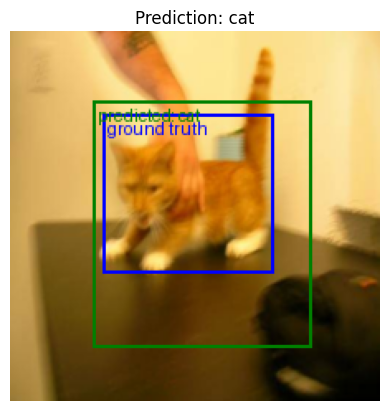

None
<class 'torchvision.tv_tensors._bounding_boxes.BoundingBoxes'> BoundingBoxes([[0.1733, 0.1107, 0.9967, 0.9929]], format=BoundingBoxFormat.XYXY, canvas_size=[224, 224]) [224, 224]
orig image shapetorch.Size([3, 224, 224])
orig bboxes: {'boxes': BoundingBoxes([[0.1733, 0.1107, 0.9967, 0.9929]], format=BoundingBoxFormat.XYXY, canvas_size=[224, 224]), 'labels': 0}
image input shape: torch.Size([1, 3, 224, 224])
pred bbox: tensor([[0.1547, 0.1179, 0.8571, 0.9024]], device='cuda:0',
       grad_fn=<SigmoidBackward0>), class_pred: tensor([[ 3.0568, -2.9281]], device='cuda:0', grad_fn=<AddmmBackward0>), label: cat
denorm shape torch.Size([3, 224, 224])

▶️ Предсказанная рамка (норм): tensor([0.1547, 0.1179, 0.8571, 0.9024])
✅ Предсказанная рамка (пиксели): tensor([ 35,  26, 192, 202], dtype=torch.int32)
🟦 Истинная рамка (норм): tensor([0.1733, 0.1107, 0.9967, 0.9929])
🟩 Истинная рамка (пиксели): tensor([ 39,  25, 223, 222], dtype=torch.int32)


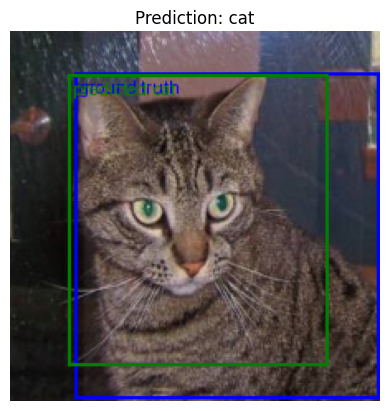

None
<class 'torchvision.tv_tensors._bounding_boxes.BoundingBoxes'> BoundingBoxes([[0.1280, 0.0027, 0.8940, 0.8850]], format=BoundingBoxFormat.XYXY, canvas_size=[224, 224]) [224, 224]
orig image shapetorch.Size([3, 224, 224])
orig bboxes: {'boxes': BoundingBoxes([[0.1280, 0.0027, 0.8940, 0.8850]], format=BoundingBoxFormat.XYXY, canvas_size=[224, 224]), 'labels': 0}
image input shape: torch.Size([1, 3, 224, 224])
pred bbox: tensor([[0.0730, 0.0641, 0.9250, 0.9505]], device='cuda:0',
       grad_fn=<SigmoidBackward0>), class_pred: tensor([[ 2.6651, -2.5183]], device='cuda:0', grad_fn=<AddmmBackward0>), label: cat
denorm shape torch.Size([3, 224, 224])

▶️ Предсказанная рамка (норм): tensor([0.0730, 0.0641, 0.9250, 0.9505])
✅ Предсказанная рамка (пиксели): tensor([ 16,  14, 207, 213], dtype=torch.int32)
🟦 Истинная рамка (норм): tensor([0.1280, 0.0027, 0.8940, 0.8850])
🟩 Истинная рамка (пиксели): tensor([ 29,   1, 200, 198], dtype=torch.int32)


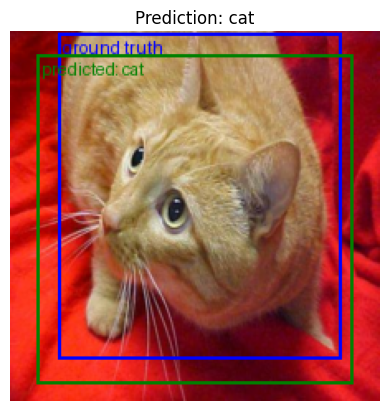

None
<class 'torchvision.tv_tensors._bounding_boxes.BoundingBoxes'> BoundingBoxes([[0.3679, 0.0968, 0.8369, 0.6254]], format=BoundingBoxFormat.XYXY, canvas_size=[224, 224]) [224, 224]
orig image shapetorch.Size([3, 224, 224])
orig bboxes: {'boxes': BoundingBoxes([[0.3679, 0.0968, 0.8369, 0.6254]], format=BoundingBoxFormat.XYXY, canvas_size=[224, 224]), 'labels': 0}
image input shape: torch.Size([1, 3, 224, 224])
pred bbox: tensor([[0.1517, 0.1077, 0.8394, 0.9290]], device='cuda:0',
       grad_fn=<SigmoidBackward0>), class_pred: tensor([[ 5.7921, -5.5201]], device='cuda:0', grad_fn=<AddmmBackward0>), label: cat
denorm shape torch.Size([3, 224, 224])

▶️ Предсказанная рамка (норм): tensor([0.1517, 0.1077, 0.8394, 0.9290])
✅ Предсказанная рамка (пиксели): tensor([ 34,  24, 188, 208], dtype=torch.int32)
🟦 Истинная рамка (норм): tensor([0.3679, 0.0968, 0.8369, 0.6254])
🟩 Истинная рамка (пиксели): tensor([ 82,  22, 187, 140], dtype=torch.int32)


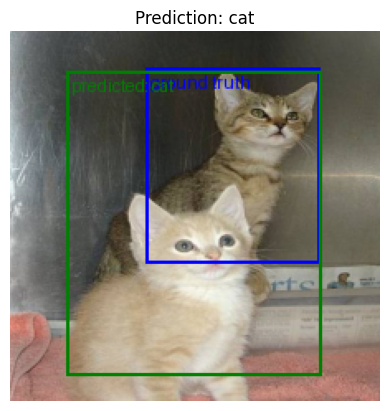

None
<class 'torchvision.tv_tensors._bounding_boxes.BoundingBoxes'> BoundingBoxes([[0.1513, 0.0846, 0.7459, 0.8317]], format=BoundingBoxFormat.XYXY, canvas_size=[224, 224]) [224, 224]
orig image shapetorch.Size([3, 224, 224])
orig bboxes: {'boxes': BoundingBoxes([[0.1513, 0.0846, 0.7459, 0.8317]], format=BoundingBoxFormat.XYXY, canvas_size=[224, 224]), 'labels': 1}
image input shape: torch.Size([1, 3, 224, 224])
pred bbox: tensor([[0.1396, 0.1192, 0.8340, 0.9090]], device='cuda:0',
       grad_fn=<SigmoidBackward0>), class_pred: tensor([[-3.2436,  3.6219]], device='cuda:0', grad_fn=<AddmmBackward0>), label: dog
denorm shape torch.Size([3, 224, 224])

▶️ Предсказанная рамка (норм): tensor([0.1396, 0.1192, 0.8340, 0.9090])
✅ Предсказанная рамка (пиксели): tensor([ 31,  27, 187, 204], dtype=torch.int32)
🟦 Истинная рамка (норм): tensor([0.1513, 0.0846, 0.7459, 0.8317])
🟩 Истинная рамка (пиксели): tensor([ 34,  19, 167, 186], dtype=torch.int32)


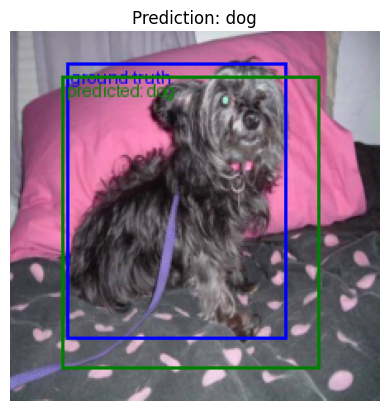

None
<class 'torchvision.tv_tensors._bounding_boxes.BoundingBoxes'> BoundingBoxes([[0.0970, 0.0526, 0.8509, 0.9889]], format=BoundingBoxFormat.XYXY, canvas_size=[224, 224]) [224, 224]
orig image shapetorch.Size([3, 224, 224])
orig bboxes: {'boxes': BoundingBoxes([[0.0970, 0.0526, 0.8509, 0.9889]], format=BoundingBoxFormat.XYXY, canvas_size=[224, 224]), 'labels': 1}
image input shape: torch.Size([1, 3, 224, 224])
pred bbox: tensor([[0.0473, 0.0315, 0.9413, 0.9830]], device='cuda:0',
       grad_fn=<SigmoidBackward0>), class_pred: tensor([[-5.1410,  5.6706]], device='cuda:0', grad_fn=<AddmmBackward0>), label: dog
denorm shape torch.Size([3, 224, 224])

▶️ Предсказанная рамка (норм): tensor([0.0473, 0.0315, 0.9413, 0.9830])
✅ Предсказанная рамка (пиксели): tensor([ 11,   7, 211, 220], dtype=torch.int32)
🟦 Истинная рамка (норм): tensor([0.0970, 0.0526, 0.8509, 0.9889])
🟩 Истинная рамка (пиксели): tensor([ 22,  12, 191, 222], dtype=torch.int32)


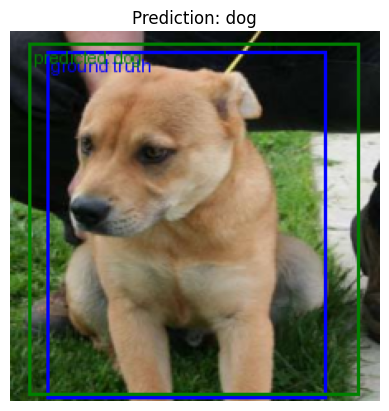

None
<class 'torchvision.tv_tensors._bounding_boxes.BoundingBoxes'> BoundingBoxes([[0.1536, 0.1185, 1.0000, 1.0000]], format=BoundingBoxFormat.XYXY, canvas_size=[224, 224]) [224, 224]
orig image shapetorch.Size([3, 224, 224])
orig bboxes: {'boxes': BoundingBoxes([[0.1536, 0.1185, 1.0000, 1.0000]], format=BoundingBoxFormat.XYXY, canvas_size=[224, 224]), 'labels': 1}
image input shape: torch.Size([1, 3, 224, 224])
pred bbox: tensor([[0.1032, 0.0859, 0.8858, 0.9393]], device='cuda:0',
       grad_fn=<SigmoidBackward0>), class_pred: tensor([[-4.6161,  5.1670]], device='cuda:0', grad_fn=<AddmmBackward0>), label: dog
denorm shape torch.Size([3, 224, 224])

▶️ Предсказанная рамка (норм): tensor([0.1032, 0.0859, 0.8858, 0.9393])
✅ Предсказанная рамка (пиксели): tensor([ 23,  19, 198, 210], dtype=torch.int32)
🟦 Истинная рамка (норм): tensor([0.1536, 0.1185, 1.0000, 1.0000])
🟩 Истинная рамка (пиксели): tensor([ 34,  27, 224, 224], dtype=torch.int32)


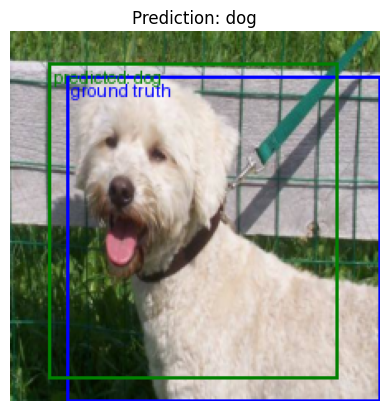

None
<class 'torchvision.tv_tensors._bounding_boxes.BoundingBoxes'> BoundingBoxes([[0.1982, 0.2665, 0.9620, 0.9087]], format=BoundingBoxFormat.XYXY, canvas_size=[224, 224]) [224, 224]
orig image shapetorch.Size([3, 224, 224])
orig bboxes: {'boxes': BoundingBoxes([[0.1982, 0.2665, 0.9620, 0.9087]], format=BoundingBoxFormat.XYXY, canvas_size=[224, 224]), 'labels': 1}
image input shape: torch.Size([1, 3, 224, 224])
pred bbox: tensor([[0.1798, 0.1387, 0.8334, 0.8831]], device='cuda:0',
       grad_fn=<SigmoidBackward0>), class_pred: tensor([[-2.6937,  2.9792]], device='cuda:0', grad_fn=<AddmmBackward0>), label: dog
denorm shape torch.Size([3, 224, 224])

▶️ Предсказанная рамка (норм): tensor([0.1798, 0.1387, 0.8334, 0.8831])
✅ Предсказанная рамка (пиксели): tensor([ 40,  31, 187, 198], dtype=torch.int32)
🟦 Истинная рамка (норм): tensor([0.1982, 0.2665, 0.9620, 0.9087])
🟩 Истинная рамка (пиксели): tensor([ 44,  60, 215, 204], dtype=torch.int32)


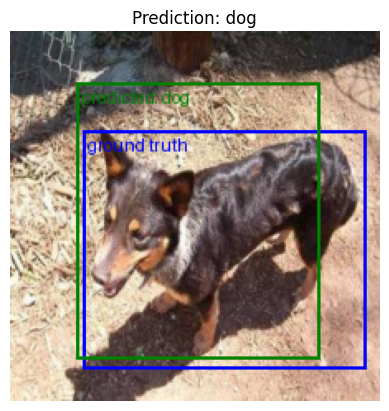

None


In [ ]:
import torchvision.transforms.functional as F
from torchvision.utils import draw_bounding_boxes

def denormalize(img_tensor):
    mean = torch.tensor([0.485, 0.456, 0.406], device=img_tensor.device)
    std = torch.tensor([0.229, 0.224, 0.225], device=img_tensor.device)
    img_tensor = img_tensor * std[:, None, None] + mean[:, None, None]
    return (img_tensor * 255).clamp(0, 255).byte()

def show_prediction(index):
    model.eval()
    image, target = dataset[index]
    print(type(target['boxes']), target['boxes'], target['boxes'].canvas_size)

    print(f"orig image shape{image.shape}")
    print(f"orig bboxes: {target}")
    image_input = image.unsqueeze(0).to(device)
    print(f"image input shape: {image_input.shape}")

    bbox_pred, class_pred = model(image_input)
    label_id = class_pred.argmax(1).item()
    label_name = "cat" if label_id == 0 else "dog"
    print(f"pred bbox: {bbox_pred}, class_pred: {class_pred}, label: {label_name}")

    denorm_img = denormalize(image.cpu())
    print(f"denorm shape {denorm_img.shape}")
    _, H, W = denorm_img.shape
    bbox_norm_pred = bbox_pred[0].detach().cpu()

    bbox_pred_abs = (bbox_pred[0].detach().cpu() * torch.tensor([W, H, W, H])).round().int()

    bbox_norm_gt = target['boxes'][0]
    bbox_gt_abs = (target['boxes'][0] * torch.tensor([W, H, W, H])).round().int()

    print(f"\n▶️ Предсказанная рамка (норм): {bbox_norm_pred}")
    print(f"✅ Предсказанная рамка (пиксели): {bbox_pred_abs}")
    print(f"🟦 Истинная рамка (норм): {bbox_norm_gt}")
    print(f"🟩 Истинная рамка (пиксели): {bbox_gt_abs}")

    all_boxes = torch.stack([bbox_gt_abs, bbox_pred_abs])
    all_labels = ["ground truth", f"predicted: {label_name}"]
    all_colors = ["blue", "green"]

    drawn = draw_bounding_boxes(
        denorm_img,
        boxes=all_boxes,
        labels=all_labels,
        colors=all_colors,
        width=2,
        font_size=14
    )

    plt.imshow(F.to_pil_image(drawn))
    plt.title(f"Prediction: {label_name}")
    plt.axis("off")
    plt.show()


images = [0, 1, 10, 20, 550, 570, 600, 700]
for i in images:
  print(show_prediction(i))

<p class="task" id="6"></p>

6\. Найдите в сети несколько изображений котов и собак. Используя любой инструмент для разметки (например, [CVAT](https://www.cvat.ai/)), выделите котов и собак на изображениях. Вставьте скриншот экспортированного файла с разметкой. Используя полученные изображения, визуализируйте разметку и bounding boxes, полученные при помощи модели.

- [ ] Проверено на семинаре

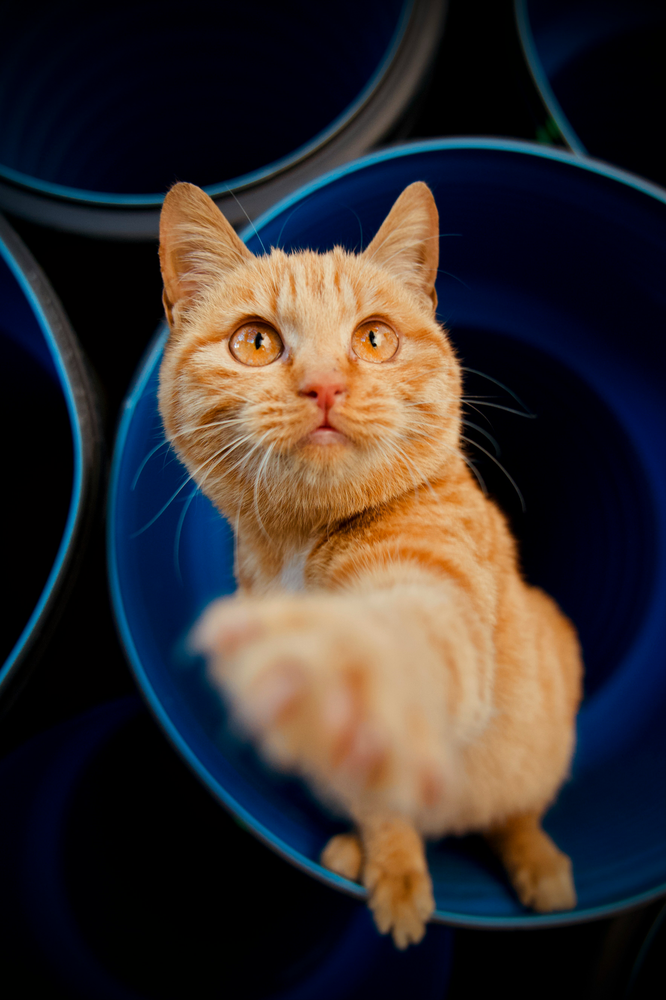

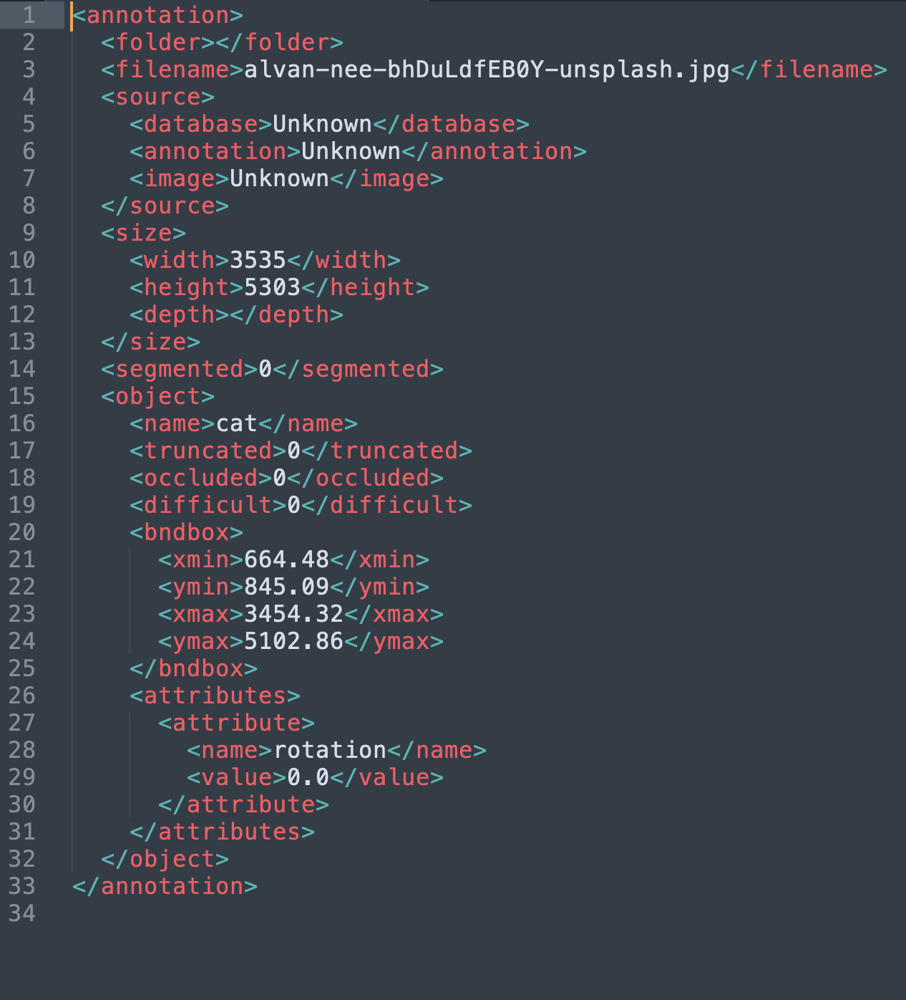

In [ ]:
import xml.etree.ElementTree as ET

def parse_voc(xml_file):

  tree = ET.parse(xml_file)
  root = tree.getroot()
  size = root.find("size")
  boxes, labels = [], []
  width = int(float(size.find("width").text))
  height = int(float(size.find("height").text))
  for obj in root.findall("object"):
    labels.append(obj.findtext("name"))
    bb = obj.find("bndbox")
    box = [float(bb.findtext(t)) for t in ("xmin","ymin","xmax","ymax")]
    boxes.append(box)
  return torch.tensor(boxes), labels, (width, height)




In [ ]:
from torchvision.ops import box_iou

def show_gt_and_pred(img_path, xml_path, model, device="cuda", save_dir="output"):

  os.makedirs(save_dir, exist_ok=True)
  pil = Image.open(img_path).convert("RGB")
  img_tf = F.resize(F.to_tensor(pil)*255, [224, 224])
  img_tf = F.normalize(img_tf/255.,
                       mean=[0.485, 0.456, 0.406],
                       std=[0.229, 0.224, 0.225]).unsqueeze(0).to(device)

  model.eval()
  with torch.no_grad():
    bb_pred, cls_pred = model(img_tf)
  label_id = cls_pred.argmax(1).item()
  pred_lbl = ["cat", "dog"][label_id]
  W, H = pil.size
  bb = bb_pred[0].cpu()
  bb = bb_pred[0].cpu()
  bb_xyxy = torch.tensor([
      bb[[0, 2]].min() * W,
      bb[[1, 3]].min() * H,
      bb[[0, 2]].max() * W,
      bb[[1, 3]].max() * H
  ]).unsqueeze(0).round().int()


  gt_boxes, gt_labels, _ = parse_voc(xml_path)
  gt_boxes = gt_boxes.round().int()

  iou = box_iou(gt_boxes.float(), bb_xyxy.float())[0][0].item()

  print(f"iou {iou}")

  print("bbox_pred tensor:", bb_xyxy)



  img_draw = draw_bounding_boxes(
        F.to_tensor(pil),
        boxes=torch.cat([gt_boxes, bb_xyxy]),
        labels=gt_labels + [f"pred:{pred_lbl}, IoU={iou:.2f}"],
        colors=["red"] * len(gt_boxes) + ["green"],
        width=15
    )

  result_img = F.to_pil_image(img_draw)
  fname = os.path.basename(img_path)
  result_img.save(os.path.join(save_dir, f"vis_{fname}"))

  plt.figure(figsize=(8, 8))
  plt.imshow(result_img)
  plt.axis("off")
  plt.title(f"Prediction: {pred_lbl}, IoU: {iou:.2f}")
  plt.show()

iou 0.7259143590927124
bbox_pred tensor: tensor([[ 321,  312, 3220, 5140]], dtype=torch.int32)


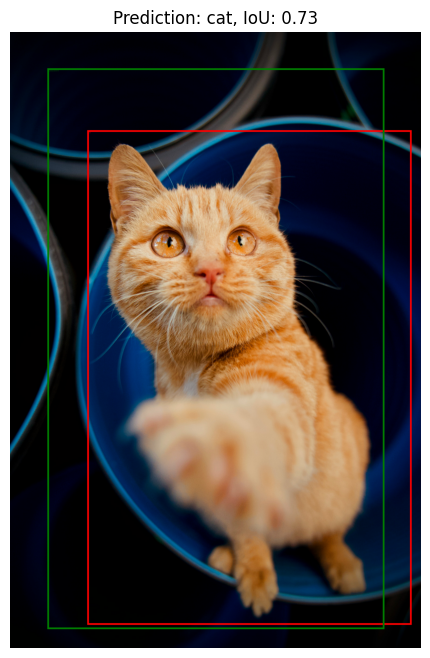

iou 0.8149122595787048
bbox_pred tensor: tensor([[ 306,  280, 2566, 3638]], dtype=torch.int32)


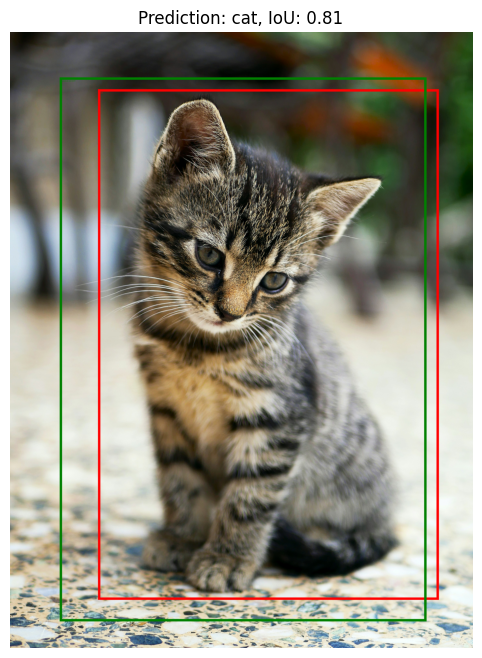

iou 0.26513877511024475
bbox_pred tensor: tensor([[ 456,  488, 3531, 5718]], dtype=torch.int32)


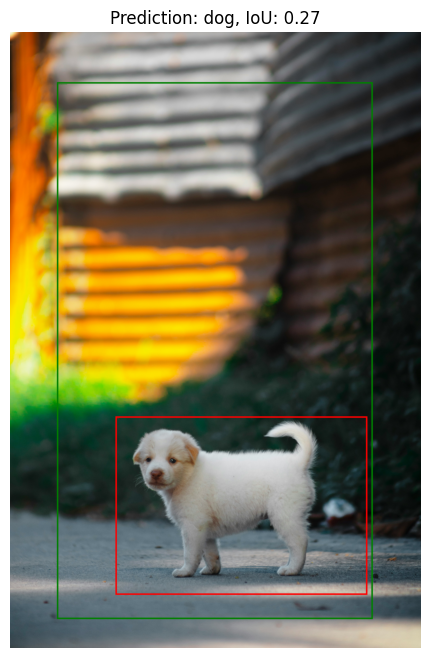

iou 0.5466035604476929
bbox_pred tensor: tensor([[ 931,  516, 3612, 2597]], dtype=torch.int32)


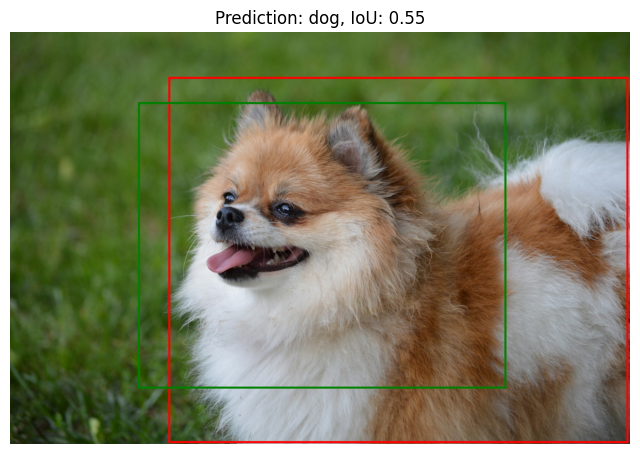

In [ ]:
import zipfile
import os
from pathlib import Path
import xml.etree.ElementTree as ET
import torch

zip_file_path = "cat_dog 2.zip"
extract_dir = "cat_dog_extracted"

with zipfile.ZipFile(zip_file_path, "r") as zip_ref:
    zip_ref.extractall(extract_dir)

root_dir = Path(extract_dir) / "cat_dog"
ann_dir = root_dir / "Annotations"
img_dir = root_dir / "JPEGImages"

device = "cuda" if torch.cuda.is_available() else "cpu"
model = TwoHeadModel(num_classes=2)
model.load_state_dict(torch.load("twohead_best.pth", map_location=device))
model.to(device).eval()

for xml_path in sorted(ann_dir.glob("*.xml")):
    try:
        tree = ET.parse(xml_path)
        root_xml = tree.getroot()
        filename = root_xml.findtext("filename") or (xml_path.stem + ".jpg")

        img_path = img_dir / filename

        if img_path.exists():
            show_gt_and_pred(str(img_path), str(xml_path), model, device=device)
        else:
            print(f"[WARN] Изображение не найдено: {img_path.name}")

    except Exception as e:
        print(f"[ERROR] Ошибка при обработке {xml_path.name}: {e}")




<p class="task" id="7"></p>

7*\. Повторите решение предыдущей задачи, используя модель `fasterrcnn_resnet50_fpn`. Замените слой для предсказания bounding box на `FastRCNNPredictor` с нужным количеством классов.

- [ ] Проверено на семинаре

In [ ]:
import torch
from torch.utils.data import DataLoader
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.datasets import ImageFolder
from torchvision import transforms
import torchvision.transforms as T
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

In [ ]:
zip_file_path = "pascal.zip"
extract_dir = "pascal_extracted"

with zipfile.ZipFile(zip_file_path, "r") as zip_ref:
    zip_ref.extractall(extract_dir)

In [ ]:
model = fasterrcnn_resnet50_fpn(pretrained=True)
num_classes = 3
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)


In [187]:
class AnimalDataset(torch.utils.data.Dataset):
  def __init__(self, root, transforms=None, target_transform=None, return_scaled=True):
    self.root = root
    self.transforms = transforms
    self.target_transform = target_transform
    self.return_scaled = return_scaled
    data_dir = os.path.join(root, "pascal/Annotations")
    self.imgs = sorted([f for f in os.listdir(data_dir) if f.endswith(".jpg")])
    self.xmls = sorted([f for f in os.listdir(data_dir) if f.endswith(".xml")])

    assert len(self.imgs) == len(self.xmls), "Number of images and masks dont match"

  def __getitem__(self, index):
    img_name = self.imgs[index]
    xml_name = self.xmls[index]
    img_path = os.path.join(self.root, "pascal/Annotations", img_name)
    xml_path = os.path.join(self.root, "pascal/Annotations", xml_name)
    img = Image.open(img_path).convert("RGB")
    parsed_data = parse_xml(xml_path)
    bbox_coords = parsed_data["scaled"] if self.return_scaled else parsed_data["raw"]
    label = parsed_data["obj_name"]
    if self.target_transform:
      label = self.target_transform(label)
    else:
      label = label

    if self.return_scaled:
            bbox_coords = {
                "xmin": bbox_coords["xmin"] * 224,
                "ymin": bbox_coords["ymin"] * 224,
                "xmax": bbox_coords["xmax"] * 224,
                "ymax": bbox_coords["ymax"] * 224,
            }

    image = tv_tensors.Image(img)

    target = {
        "boxes": tv_tensors.BoundingBoxes([list(bbox_coords.values())], format="XYXY", canvas_size=[224, 224]),
        "labels": torch.tensor([label])
    }

    if self.transforms:
      image, target = self.transforms(image, target)

    return image, target

  def __len__(self):

    return len(self.imgs)



In [188]:
from torchvision.transforms import v2 as T

transform = T.Compose([
    T.Resize((224, 224)),
    T.ToDtype(torch.float32, scale=True),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

def label_to_id(label):
  return 0 if label=="cat" else 1

dataset = AnimalDataset(
    root="pascal_extracted",
    transforms=transform,
    target_transform=label_to_id,
    return_scaled=True
)

if len(dataset) == 0:
    raise ValueError("Dataset is empty!")

train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size

train_ds, val_ds = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(
    train_ds, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x))
)
valid_loader = DataLoader(
    val_ds, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x))
)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

model.to(device)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)


In [190]:
num_epochs = 10
for epoch in range(num_epochs):
  model.train()
  train_loss = 0.0
  for images, targets in train_loader:

    images = list(image.to(device) for image in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

    optimizer.zero_grad()
    loss_dict = model(images, targets)

    losses = sum(loss for loss in loss_dict.values())

    losses.backward()
    optimizer.step()
    train_loss += losses.item()

  lr_scheduler.step()
  print(f'Epoch: {epoch + 1}, Loss: {train_loss / len(train_loader)}')


Epoch: 1, Loss: 0.10736460611224174
Epoch: 2, Loss: 0.09641981976372856
Epoch: 3, Loss: 0.09335530123540334
Epoch: 4, Loss: 0.10077184598360743
Epoch: 5, Loss: 0.09153606316873006
Epoch: 6, Loss: 0.09562696250421661
Epoch: 7, Loss: 0.09051590678947312
Epoch: 8, Loss: 0.0795218963176012
Epoch: 9, Loss: 0.07849394051092011
Epoch: 10, Loss: 0.08950452346886907


In [212]:
import torchvision.transforms.functional as F
from torchvision.utils import draw_bounding_boxes
import matplotlib.pyplot as plt
import torch


def denormalize(img_tensor):
    mean = torch.tensor([0.485, 0.456, 0.406], device=img_tensor.device)
    std = torch.tensor([0.229, 0.224, 0.225], device=img_tensor.device)
    img_tensor = img_tensor * std[:, None, None] + mean[:, None, None]
    return (img_tensor * 255).clamp(0, 255).byte()

def show_fasterrcnn_prediction(index, dataset, model, device, score_thresh=0.5):
    model.eval()
    image, target = dataset[index]

    image_input = image.unsqueeze(0).to(device)

    with torch.no_grad():
        prediction = model(image_input)[0]

    denorm_img = denormalize(image.cpu())

    _, H, W = denorm_img.shape

    gt_boxes = target["boxes"]
    gt_boxes = gt_boxes[0].round().int()

    pred_boxes = []
    pred_labels = []
    for bbox, label, score in zip(prediction['boxes'], prediction['labels'], prediction['scores']):
        if score >= score_thresh:
            box_abs = bbox.round().int()
            pred_boxes.append(box_abs)
            pred_labels.append(f"pred: {label.item()} ({score:.2f})")

    if len(pred_boxes) > 0:
        pred_boxes = torch.stack(pred_boxes)
    else:
        pred_boxes = torch.empty((0, 4), dtype=torch.int)


    all_boxes = torch.cat([gt_boxes.unsqueeze(0), pred_boxes.cpu()], dim=0) if len(pred_boxes) > 0 else gt_boxes.unsqueeze(0)
    all_labels = ["ground truth"] + pred_labels if len(pred_labels) > 0 else ["ground truth"]
    all_colors = ["blue"] + ["green"] * len(pred_labels)

    drawn = draw_bounding_boxes(
        denorm_img,
        boxes=all_boxes,
        labels=all_labels,
        colors=all_colors,
        width=2,
        font_size=14
    )

    plt.figure(figsize=(10, 8))
    plt.imshow(F.to_pil_image(drawn))
    plt.title("Faster R-CNN Prediction")
    plt.axis("off")
    plt.show()


tensor([ 30,  63, 164, 126], dtype=torch.int32)
tensor([[ 12,  92, 198, 224],
        [ 47,  24, 154, 224],
        [  0,  44, 224, 166]], device='cuda:0', dtype=torch.int32)


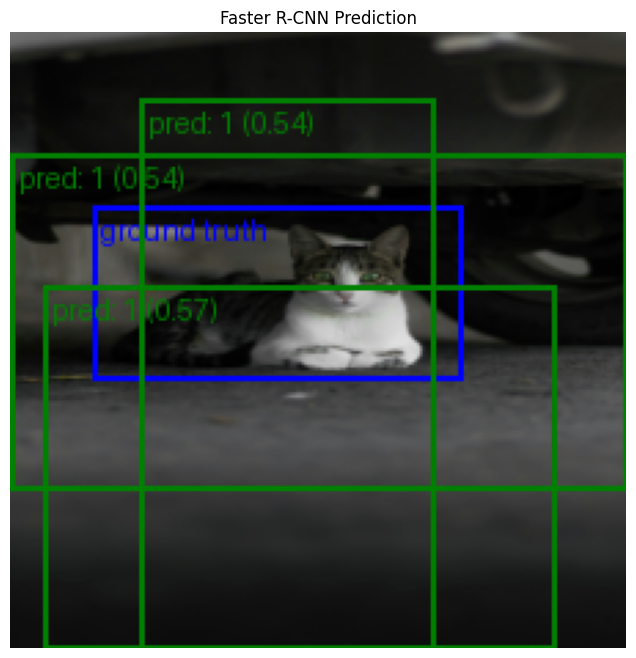

tensor([ 57,  24, 162, 223], dtype=torch.int32)
tensor([[ 22,  31, 215, 224],
        [ 84,   0, 189, 222],
        [ 37,  10, 140, 206]], device='cuda:0', dtype=torch.int32)


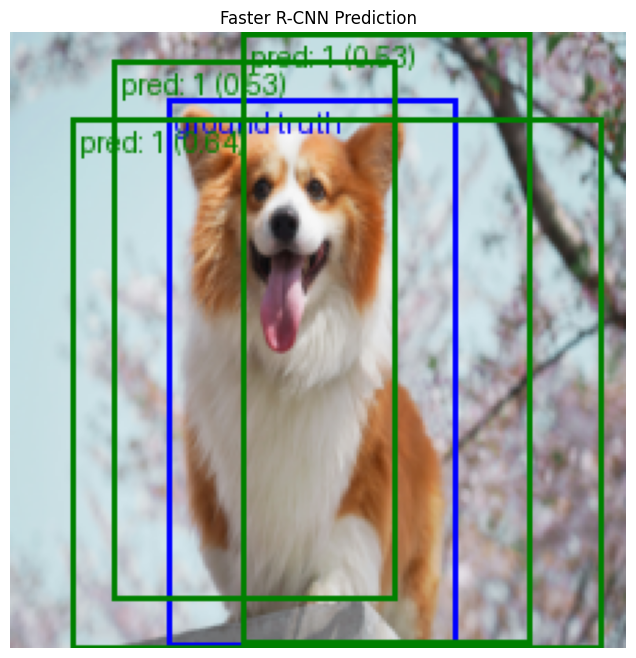

tensor([ 93,  71, 129, 184], dtype=torch.int32)
tensor([[ 83,   9, 183, 216],
        [  9,  27, 208, 224],
        [  2,  10, 216, 133]], device='cuda:0', dtype=torch.int32)


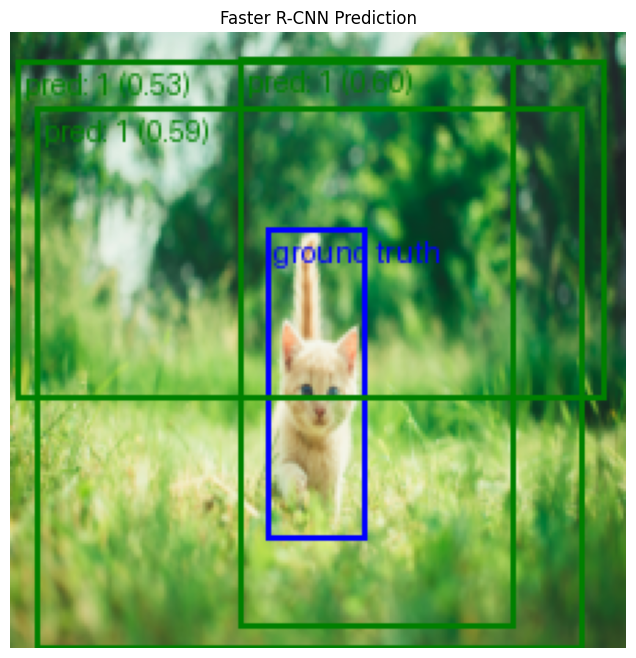

tensor([  7,  40, 218, 207], dtype=torch.int32)
tensor([], size=(0, 4), dtype=torch.int32)


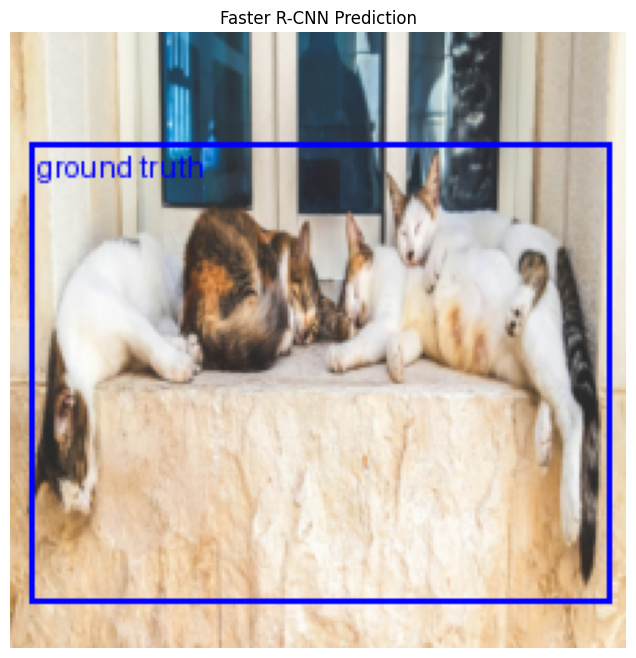

tensor([  4,  93, 223, 187], dtype=torch.int32)
tensor([[  3,  66, 200, 224],
        [ 60,   0, 182, 224],
        [  0,   0, 224, 114]], device='cuda:0', dtype=torch.int32)


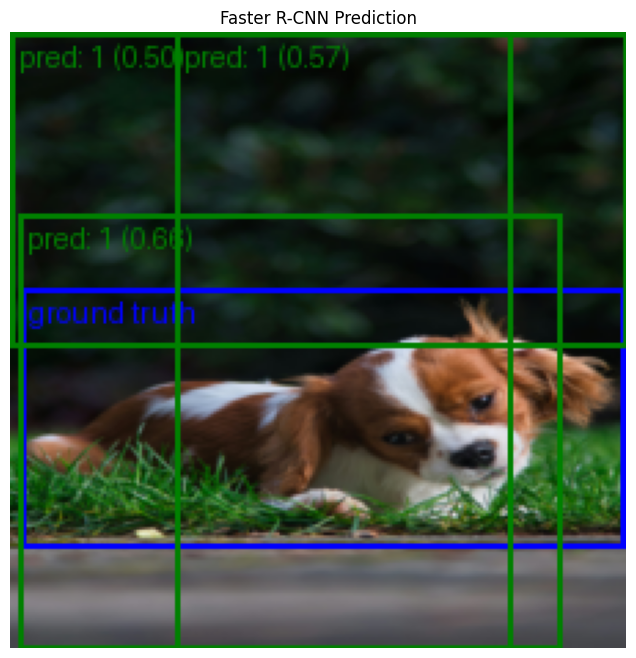

tensor([ 13,  56, 224, 224], dtype=torch.int32)
tensor([[ 16,  71, 224, 224]], device='cuda:0', dtype=torch.int32)


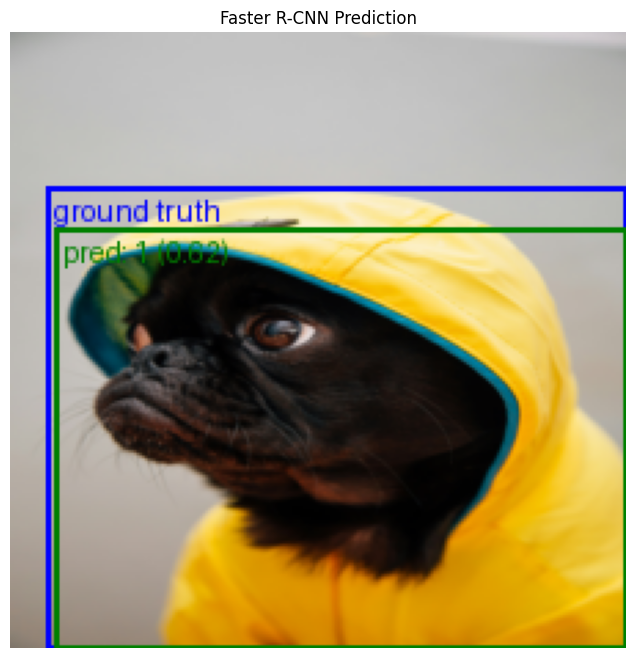

tensor([ 29,  42, 168, 223], dtype=torch.int32)
tensor([[ 73,   0, 188, 185],
        [ 49,  56, 154, 224]], device='cuda:0', dtype=torch.int32)


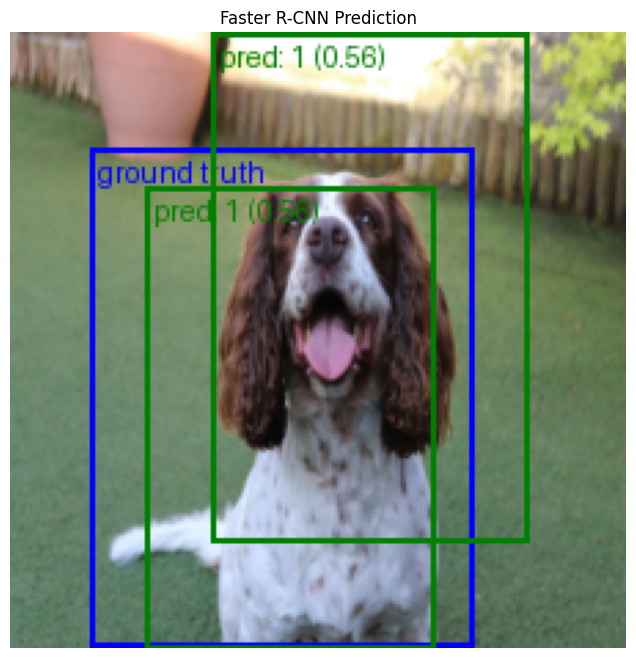

tensor([ 29,  31, 182, 223], dtype=torch.int32)
tensor([[ 66,  46, 179, 224],
        [  3,  76, 219, 224],
        [  9,  31, 224, 147]], device='cuda:0', dtype=torch.int32)


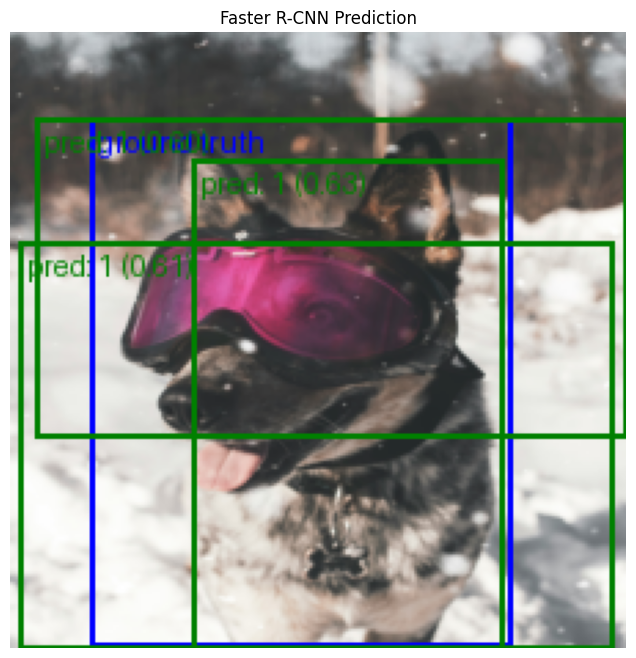

tensor([ 12,  36, 223, 195], dtype=torch.int32)
tensor([[  7, 134, 224, 224],
        [  8,  82, 149, 224],
        [ 21,  19, 224, 224]], device='cuda:0', dtype=torch.int32)


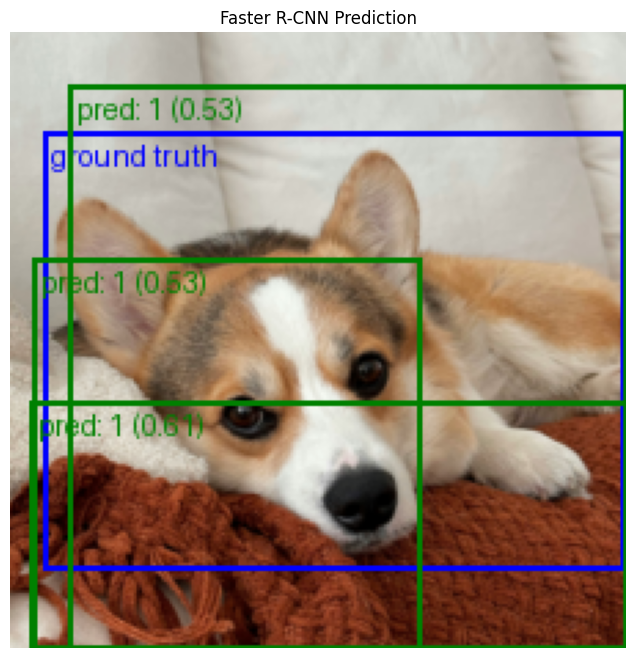

In [214]:
images = [0, 1, 2, 3, 4, 5, 6, 7, 30]

for idx in images:
    show_fasterrcnn_prediction(idx, dataset=dataset, model=model, device=device)
